# Causal Effect of Superhost on Annual Revenue in the Booking Industry

Question of Interest: 
- Do **listings** with their hosts identified as **Superhosts** have a higher **annual revenue** compared with those whose hosts are not Superhosts?

In [164]:
# Optional for clear plotting on Macs
%config InlineBackend.figure_format='retina'

# Some of the network training leads to warnings. When we know and are OK with
#  what's causing the warning and simply don't want to see it, we can use the
#  following code. Run this block
#  to disable warnings
import sys
import os
import warnings

warnings.filterwarnings("ignore")
if not sys.warnoptions:
    warnings.simplefilter("ignore")
    os.environ["PYTHONWARNINGS"] = "ignore"

In [165]:
# Install libraries
# !pip install dame_flame
# !pip install stargazer

In [166]:
# Load libraries
import pandas as pd
import numpy as np

from sklearn.impute import SimpleImputer
from statsmodels.stats.outliers_influence import variance_inflation_factor

from scipy import stats
from plotnine import *
import dame_flame
import statsmodels.formula.api as smf
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from pathlib import Path
import altair as alt
alt.data_transformers.disable_max_rows()
from statsmodels.graphics.gofplots import ProbPlot

# 1. Data Loading

In this study, we investigate the listings in Florida and California.

In [167]:
# Load datasets
fl = pd.read_csv('../00_source_data/listings_florida.csv.gz')
ca = pd.read_csv('../00_source_data/listings_california.csv.gz')

In [168]:
# Add county column to datasets
fl['county'] = 'FL'
ca['county'] = 'CA'

In [169]:
# Merge datasets into one
frames = [fl, ca]
listings = pd.concat(frames, ignore_index=True)

In [170]:
print ("The shape of the dataset: ", listings.shape)
listings.head()

The shape of the dataset:  (45860, 75)


,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,county
0,57818,https://www.airbnb.com/rooms/57818,20211223224458,2021-12-24,Private house close to the beach!,Beautifully private duplex that allows you to ...,Check-in window<br />After 3:00 PM<br />Edit<b...,https://a0.muscache.com/pictures/347696/9d5168...,275948,https://www.airbnb.com/users/show/275948,...,4.88,4.70,NaN,f,1,1,0,0,0.51,FL
1,69824,https://www.airbnb.com/rooms/69824,20211223224458,2021-12-24,2 bd/2ba Oceanfront Condo,<b>The space</b><br />Beautiful and meticulous...,NaN,https://a0.muscache.com/pictures/443102/f6b94e...,351303,https://www.airbnb.com/users/show/351303,...,5.00,4.00,NaN,f,2,2,0,0,0.04,FL
2,83449,https://www.airbnb.com/rooms/83449,20211223224458,2021-12-24,MARY POP APTS 2/1 APT SLEEP 5,MARY POP APARTMENTS 1&2 BEDROOM SUITES ACCOMMO...,NaN,https://a0.muscache.com/pictures/13dd4c7e-4914...,454736,https://www.airbnb.com/users/show/454736,...,4.79,4.89,NaN,f,8,8,0,0,0.16,FL
3,105411,https://www.airbnb.com/rooms/105411,20211223224458,2021-12-24,House in the Ranches,Close to Cleveland Clinic Hospital and mayor h...,"Very close to I75, one of the main highways. Y...",https://a0.muscache.com/pictures/787317/2cc18e...,532930,https://www.airbnb.com/users/show/532930,...,4.25,5.00,NaN,f,1,1,0,0,0.04,FL
4,129061,https://www.airbnb.com/rooms/129061,20211223224458,2021-12-24,MIAMI - LUXURY APARTMENT OVER BEACH,<b>The space</b><br />The apartment is located...,NaN,https://a0.muscache.com/pictures/828456/8efef9...,637272,https://www.airbnb.com/users/show/637272,...,4.61,4.50,NaN,f,6,6,0,0,0.14,FL


In [171]:
listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'description',
       'neighborhood_overview', 'picture_url', 'host_id', 'host_url',
       'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'calendar_upd

# 2. Data Preprocessing

## 2-1 Data Wrangling

There're totally 75 variables in the dataset. We base on our question of interest, the causal effect **on listing** and **domain knowledge** (or the common sense) in the hospitality industry to decide which variables to keep and which to drop.

In [172]:
# List unecessary columns
columns_to_be_dropped = [
    "id",
    "listing_url",
    "scrape_id",
    "name",
    "description", # future work: apply NLP to extract meaning
    "neighborhood_overview", # future work: apply NLP to extract meaning; geospatial analysis
    "picture_url",
    "host_url",
    "host_name",
    "host_location", # future work: apply NLP to extract meaning; geospatial analysis
    "host_about", # future work: apply NLP to extract meaning
    "host_thumbnail_url",
    "host_picture_url",
    "host_neighbourhood", # future work: apply NLP to extract meaning; geospatial analysis
    # "host_listings_count", # Tego: shall be kept
    # "host_total_listings_count", # Tego: shall be kept
    # "host_verifications", # Tego: shall transform into the number of verification methods
    "neighbourhood", # future work: geospatial analysis
    "neighbourhood_cleansed", # future work: geospatial analysis
    "neighbourhood_group_cleansed", # null column
    "latitude", # future work: geospatial analysis
    "longitude", # future work: geospatial analysis
    "property_type", # a variable with mix definition: Self selected property type. Hotels and Bed and Breakfasts are described as such by their hosts in this field
    "bathrooms", # similar variable "bathrooms_text" exists
    # """
    # The below 7 variables are for calculating response, so we tentatively keep them all
    # """
    # "minimum_nights", 
    # "maximum_nights",
    # "minimum_minimum_nights",
    # "maximum_minimum_nights",
    # "minimum_maximum_nights",
    # "maximum_maximum_nights",
    # "maximum_nights_avg_ntm",
    "calendar_updated", # null column
    # "availability_30",  
    # "availability_60",  
    # "availability_90", 
    "calendar_last_scraped",
    # "number_of_reviews", # Tego: shall be kept
    # "number_of_reviews_l30d", 
    "license", # null column
    "calculated_host_listings_count_entire_homes", 
    "calculated_host_listings_count_private_rooms", 
    "calculated_host_listings_count_shared_rooms"
    # "first_review", 
    # "last_review", 
    # """
    # For the following 6 columns, though keeping them might result in multicollinearity, 
    # we think they might be critical factors for revenue. Thus, we decide to keep them.
    # """
    # "review_scores_accuracy", 
    # "review_scores_cleanliness",
    # "review_scores_checkin",  
    # "review_scores_communication",
    # "review_scores_location", 
    # "review_scores_value"  
]

In [173]:
# Drop unecessary columns
listings = listings.drop(columns_to_be_dropped, axis = 1)

In [174]:
print ("The shape of adjusted dataset: ", listings.shape)
listings.columns

The shape of adjusted dataset:  (45860, 48)


Index(['last_scraped', 'host_id', 'host_since', 'host_response_time',
       'host_response_rate', 'host_acceptance_rate', 'host_is_superhost',
       'host_listings_count', 'host_total_listings_count',
       'host_verifications', 'host_has_profile_pic', 'host_identity_verified',
       'room_type', 'accommodates', 'bathrooms_text', 'bedrooms', 'beds',
       'amenities', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'first_review', 'last_review',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',

We then transform the categorical variables into numeric ones for the following analysis through DAME.

In [175]:
# Clean categorical variables
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within an hour', 0, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a few hours', 1, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'within a day', 2, listings['host_response_time'])
listings['host_response_time'] = np.where(listings['host_response_time'] == 'a few days or more', 3, listings['host_response_time'])

listings['host_acceptance_rate'] = listings['host_acceptance_rate'].str.strip('%')
listings['host_response_rate'] = listings['host_response_rate'].str.strip('%')

listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 't', 1, listings['host_is_superhost'])
listings['host_is_superhost'] = np.where(listings['host_is_superhost'] == 'f', 0, listings['host_is_superhost'])

listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 't', 1, listings['host_has_profile_pic'])
listings['host_has_profile_pic'] = np.where(listings['host_has_profile_pic'] == 'f', 0, listings['host_has_profile_pic'])

listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 't', 1, listings['host_identity_verified'])
listings['host_identity_verified'] = np.where(listings['host_identity_verified'] == 'f', 0, listings['host_identity_verified'])

listings['room_type'] = np.where(listings['room_type'] == 'Entire home/apt', 0, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Hotel room', 1, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Private room', 2, listings['room_type'])
listings['room_type'] = np.where(listings['room_type'] == 'Shared room', 3, listings['room_type'])

listings['essentials'] = listings['amenities']
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential'), 1, listings['essentials'])
listings['essentials'] = np.where(listings['essentials'].str.contains('Essential') == False, 0, listings['essentials'])

listings['other_amenities'] = listings['amenities']
listings["other_amenities"] = np.where(
    listings["other_amenities"].str.contains("Essential") == False,
    listings["other_amenities"].apply(lambda x: len(x.split(","))),
    (
        np.where(
            listings["other_amenities"].str.contains("Essential") == True,
            listings["other_amenities"].apply(lambda x: len(x.split(",")) - 1),
            listings["other_amenities"],
        )
    ),
)

listings['has_availability'] = np.where(listings['has_availability'] == 't', 1, listings['has_availability'])
listings['has_availability'] = np.where(listings['has_availability'] == 'f', 0, listings['has_availability'])

listings['instant_bookable'] = np.where(listings['instant_bookable'] == 't', 1, listings['instant_bookable'])
listings['instant_bookable'] = np.where(listings['instant_bookable'] == 'f', 0, listings['instant_bookable'])

listings['bathrooms_number'] = listings['bathrooms_text'].str.split(" ").str[0]
listings["bathrooms_number"] = np.where(
    listings["bathrooms_number"] == "Private",
    1,
    (
        np.where(
            listings["bathrooms_number"] == "Shared",
            1,
            np.where(
                listings["bathrooms_number"] == "Half-bath",
                1,
                listings["bathrooms_number"],
            ),
        )
    ),
)

listings['price'] = listings['price'].str.strip('$')
listings['number_of_reviews_ltm'] = np.where(listings['number_of_reviews_ltm'] <= 0, 1, listings['number_of_reviews_ltm'])
listings['total_bookings_last_year'] = listings['number_of_reviews_ltm'] * 3 / 2 ## Assume 2/3 of the bookings will leave a review; 

In [176]:
# "host_verifications", # Tego: shall transform into the number of verification methods, 
listings['number_host_verifications'] = listings['host_verifications'].str.split(",").apply(len)

listings['first_review'] = listings['first_review'].astype('datetime64[ns]')
listings["first_review_year"] = listings['first_review'].dt.year
listings['last_review'] = listings['last_review'].astype('datetime64[ns]')
listings["last_review_year"] = listings['last_review'].dt.year

# Calculate Host Experience
listings['last_scraped'] = listings['last_scraped'].astype('datetime64[ns]')
listings['host_since'] = listings['host_since'].astype('datetime64[ns]')
listings['host_experience'] = (listings['last_scraped'] - listings['host_since']).dt.days/365

listings.drop(columns=['last_scraped', 'host_since', 'amenities', 'host_verifications', 'first_review', 'last_review', 'bathrooms_text'], inplace = True)
# listings.drop(columns=['last_scraped', 'host_since', 'amenities', 'host_verifications', 'bathrooms_text'], inplace = True)


"""
Below are features that require no further preprocessing:

"host_total_listings_count",
"availability_30",
"availability_60",
"availability_90",
"number_of_reviews",
"number_of_reviews_l30d",
"calculated_host_listings_count_entire_homes",
"calculated_host_listings_count_private_rooms",
"calculated_host_listings_count_shared_rooms",
"review_scores_accuracy",
"review_scores_cleanliness",
"review_scores_checkin", 
"review_scores_communication", 
"review_scores_location", 
"review_scores_value"
"""

'\nBelow are features that require no further preprocessing:\n\n"host_total_listings_count",\n"availability_30",\n"availability_60",\n"availability_90",\n"number_of_reviews",\n"number_of_reviews_l30d",\n"calculated_host_listings_count_entire_homes",\n"calculated_host_listings_count_private_rooms",\n"calculated_host_listings_count_shared_rooms",\n"review_scores_accuracy",\n"review_scores_cleanliness",\n"review_scores_checkin", \n"review_scores_communication", \n"review_scores_location", \n"review_scores_value"\n'

## 2-2 Missing Data Handling

In [177]:
listings2 = listings.copy()

In [178]:
listings2.isna().sum()

host_id                               0
host_response_time                11633
host_response_rate                11633
host_acceptance_rate              10781
host_is_superhost                    10
host_listings_count                  10
host_total_listings_count            10
host_has_profile_pic                 10
host_identity_verified               10
room_type                             0
accommodates                          0
bedrooms                           4940
beds                               2052
price                                 0
minimum_nights                        0
maximum_nights                        0
minimum_minimum_nights                4
maximum_minimum_nights                4
minimum_maximum_nights                4
maximum_maximum_nights                4
minimum_nights_avg_ntm                4
maximum_nights_avg_ntm                4
has_availability                      0
availability_30                       0
availability_60                       0


The variables with the missing values form two clusters, one with over 10K missing values, and the other. We deal with the latter cluster first.

In [179]:
print ("The distribution of bedrooms", listings2.bedrooms.value_counts())
print ("The distribution of beds", listings2.beds.value_counts())

The distribution of bedrooms 1.0     23501
2.0      9201
3.0      4716
4.0      2177
5.0       858
6.0       282
7.0       110
8.0        44
9.0        13
10.0        8
12.0        5
11.0        2
21.0        1
13.0        1
15.0        1
Name: bedrooms, dtype: int64
The distribution of beds 1.0     19042
2.0     11153
3.0      5838
4.0      3899
5.0      1764
6.0       989
7.0       452
8.0       344
9.0       108
10.0       72
11.0       48
12.0       40
14.0       12
13.0       12
16.0       10
15.0        6
19.0        4
18.0        3
22.0        3
17.0        2
21.0        2
20.0        2
23.0        1
24.0        1
26.0        1
Name: beds, dtype: int64


In [180]:
imp = SimpleImputer(strategy="most_frequent")

# index will be unchanged after imputation
# print (X_train_ohe.index) 
listings2_imputed = imp.fit_transform(np.asanyarray(listings2[['bedrooms', 'beds']])) # return a numpy array
listings2_imputed = pd.DataFrame(listings2_imputed, columns = ['bedrooms', 'beds'], index = listings2.index) # transform it back as dataframe
# print (X_train_ohe_imputed.index)

In [181]:
listings2_imputed.isna().sum()

bedrooms    0
beds        0
dtype: int64

In [182]:
listings2['bedrooms'] = listings2_imputed['bedrooms']
listings2['beds'] = listings2_imputed['beds']

Then we deal with the first cluster, as these might all be critical features of our response variable, we could only keep the variables but remove the missing value directly. Imputating so much missing values (over 25%) might lead to bias. 

In [183]:
print ("Missing overlap ratio of host_response_time and host_acceptance_rate: ", 
        np.sum(listings2.host_response_time.isna() == listings2.host_acceptance_rate.isna())/len(listings2))

print ("Missing overlap ratio of review_scores_rating and review_scores_accuracy: ", 
        np.sum(listings2.review_scores_rating.isna() == listings2.review_scores_accuracy.isna())/len(listings2))

print ("Missing overlap ratio of first_review_year and review_scores_rating: ", 
        np.sum(listings2.first_review_year.isna() == listings2.review_scores_rating.isna())/len(listings2))

print ("Missing overlap ratio of host_response_time and review_scores_value: ", 
        np.sum(listings2.host_response_time.isna() == listings2.review_scores_value.isna())/len(listings2))

Missing overlap ratio of host_response_time and host_acceptance_rate:  0.9426951591801134
Missing overlap ratio of review_scores_rating and review_scores_accuracy:  0.9916703009158307
Missing overlap ratio of first_review_year and review_scores_rating:  1.0
Missing overlap ratio of host_response_time and review_scores_value:  0.6733318796336677


In [184]:
listings2.dropna(inplace = True)
listings2.shape

(26696, 49)

In [185]:
# Check NA
listings2.isna().sum()

host_id                           0
host_response_time                0
host_response_rate                0
host_acceptance_rate              0
host_is_superhost                 0
host_listings_count               0
host_total_listings_count         0
host_has_profile_pic              0
host_identity_verified            0
room_type                         0
accommodates                      0
bedrooms                          0
beds                              0
price                             0
minimum_nights                    0
maximum_nights                    0
minimum_minimum_nights            0
maximum_minimum_nights            0
minimum_maximum_nights            0
maximum_maximum_nights            0
minimum_nights_avg_ntm            0
maximum_nights_avg_ntm            0
has_availability                  0
availability_30                   0
availability_60                   0
availability_90                   0
availability_365                  0
number_of_reviews           

## 2-3 Calculating Response Variable

### 2-3-1 Definition of annual listing revenue:

1. We assume the 2/3 of the people who booked a listing will leave reviews. (Based on reference documents) That way we calculate the variable, *total_bookings_last_year*.

2. Then we estimate the minimum revenue each booking could have - the minimum nights required for each booking, which is the variable, *minimum_nights_avg_ntm*.

3. Mutiplying the above two variables with listing price per night, we could estimate the <font color='yellow'> expected minimum annual revenue of this listing</font>. 

In [186]:
# Calculate Annual Revenue
listings2['price'] = listings2['price'].apply(lambda x: float(x.split()[0].replace(',', '')))
listings2['annual_listing_revenue'] =  listings2.price * listings2.minimum_nights_avg_ntm * listings2.total_bookings_last_year
listings2 = listings2.drop(columns=['price', 'number_of_reviews', 'number_of_reviews_ltm', "total_bookings_last_year", 
                                    "minimum_nights", "maximum_nights", "minimum_minimum_nights", "maximum_minimum_nights", 
                                    "minimum_maximum_nights","maximum_maximum_nights", "maximum_nights_avg_ntm", "minimum_nights_avg_ntm"
                                    ])
# listings2['annual_listing_revenue'] =  listings2.price * listings2.total_bookings_last_year
# listings2 = listings2.drop(columns=['price', 'number_of_reviews', 'number_of_reviews_ltm', "total_bookings_last_year"])

In [187]:
listings2[listings2['annual_listing_revenue'] <= 0]

,host_id,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,room_type,...,reviews_per_month,county,essentials,other_amenities,bathrooms_number,number_host_verifications,first_review_year,last_review_year,host_experience,annual_listing_revenue


### 2-3-2 Future work for response definition

Based on below value distribution of *minimum_nights_avg_ntm*, we could find out that the dataset are mainly composed of two types, daily or monthly rentals. Their corresponding feature importance might be different, so separating the dataset accordingly for future research is suggested. 

In [188]:
listings.minimum_nights_avg_ntm.value_counts()
print ("Check daily rental: \n", listings[listings.minimum_nights_avg_ntm < 29]['minimum_nights_avg_ntm'].value_counts()[:10]) #1,2,3,4,5,7
print ("Check monthly rental: \n", listings[listings.minimum_nights_avg_ntm >= 30]['minimum_nights_avg_ntm'].value_counts()) # 30, 31

Check daily rental: 
 1.0     7267
2.0     5658
3.0     4045
4.0     1328
7.0     1202
5.0     1196
1.3      549
4.1      250
6.0      243
2.1      243
3.1      233
10.0     232
Name: minimum_nights_avg_ntm, dtype: int64
Check monthly rental: 
 30.0     14163
31.0      2795
90.0       214
60.0       171
711.8      107
         ...  
330.0        1
270.0        1
288.6        1
308.2        1
684.2        1
Name: minimum_nights_avg_ntm, Length: 231, dtype: int64


## 2-4 Setting Up Data Type 

In [189]:
listings3 = listings2.copy()

In [190]:
listings3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26696 entries, 0 to 45819
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_id                         26696 non-null  int64  
 1   host_response_time              26696 non-null  object 
 2   host_response_rate              26696 non-null  object 
 3   host_acceptance_rate            26696 non-null  object 
 4   host_is_superhost               26696 non-null  object 
 5   host_listings_count             26696 non-null  float64
 6   host_total_listings_count       26696 non-null  float64
 7   host_has_profile_pic            26696 non-null  object 
 8   host_identity_verified          26696 non-null  object 
 9   room_type                       26696 non-null  object 
 10  accommodates                    26696 non-null  int64  
 11  bedrooms                        26696 non-null  float64
 12  beds                            

In [191]:
# Change datatypes
listings3['host_response_time'] = listings3['host_response_time'].astype('category')
listings3['host_response_rate'] = listings3['host_response_rate'].astype('int')
listings3['host_acceptance_rate'] = listings3['host_acceptance_rate'].astype('int')
listings3['host_is_superhost'] = listings3['host_is_superhost'].astype('category')
listings3['host_total_listings_count'] = listings3['host_total_listings_count'].astype('int')
listings3['host_has_profile_pic'] = listings3['host_has_profile_pic'].astype('category')
listings3['host_identity_verified'] = listings3['host_identity_verified'].astype('category')
listings3['room_type'] = listings3['room_type'].astype('category')
listings3['bedrooms'] = listings3['bedrooms'].astype('int')
listings3['beds'] = listings3['beds'].astype('int')
# listings3['minimum_nights_avg_ntm'] = listings3['minimum_nights_avg_ntm'].astype('int')
listings3['has_availability'] = listings3['has_availability'].astype('category')
listings3['instant_bookable'] = listings3['instant_bookable'].astype('category')
listings3["county"] = listings3["county"].astype("category")
listings3["county"] = listings3["county"].cat.codes
listings3['essentials'] = listings3['essentials'].astype('category')
listings3['other_amenities'] = listings3['other_amenities'].astype('int')
listings3['bathrooms_number'] = listings3['bathrooms_number'].astype('float')
listings3['first_review_year'] = listings3['first_review_year'].astype('int')
listings3['last_review_year'] = listings3['last_review_year'].astype('int')
listings3['host_experience'] = listings3['host_experience'].astype('int')
listings3['annual_listing_revenue'] = listings3['annual_listing_revenue'].astype('float')

In [192]:
listings3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26696 entries, 0 to 45819
Data columns (total 38 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   host_id                         26696 non-null  int64   
 1   host_response_time              26696 non-null  category
 2   host_response_rate              26696 non-null  int64   
 3   host_acceptance_rate            26696 non-null  int64   
 4   host_is_superhost               26696 non-null  category
 5   host_listings_count             26696 non-null  float64 
 6   host_total_listings_count       26696 non-null  int64   
 7   host_has_profile_pic            26696 non-null  category
 8   host_identity_verified          26696 non-null  category
 9   room_type                       26696 non-null  category
 10  accommodates                    26696 non-null  int64   
 11  bedrooms                        26696 non-null  int64   
 12  beds              

In [193]:
# Check code for counties 
c = listings.county.astype('category')

d = dict(enumerate(c.cat.categories))
print (d)

{0: 'CA', 1: 'FL'}


## 2-5 Check Multicollinearity 

In [194]:
X = listings3[list(listings3.columns[1:-1])]

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['feature_name'] = X.columns
vif_info.sort_values('VIF', ascending=False, inplace=True)
vif_info[vif_info.VIF > 10]

,VIF,feature_name
4,inf,host_listings_count
5,inf,host_total_listings_count
34,1.376807e+06,last_review_year
33,1.369397e+06,first_review_year
12,2.077261e+03,has_availability
18,7.016690e+02,review_scores_rating
19,5.052618e+02,review_scores_accuracy
22,4.588658e+02,review_scores_communication
24,4.426084e+02,review_scores_value
21,3.854372e+02,review_scores_checkin


In [195]:
vif_info

,VIF,feature_name
4,inf,host_listings_count
5,inf,host_total_listings_count
34,1.376807e+06,last_review_year
33,1.369397e+06,first_review_year
12,2.077261e+03,has_availability
18,7.016690e+02,review_scores_rating
19,5.052618e+02,review_scores_accuracy
22,4.588658e+02,review_scores_communication
24,4.426084e+02,review_scores_value
21,3.854372e+02,review_scores_checkin


As the goal of this research is to interpret superhost's effect of annual revenue of listing, we shall try to have fewer variables exceed VIF = 10, especially the ones whose VIF exceed 50, as possible meanwhile considering the domain knowledge. 

In [196]:
col_multicollinearity = ['host_listings_count', 
                        'last_review_year', 'first_review_year', 
                        "has_availability", "availability_30", "availability_60", "availability_90",  # redundant to availability_365
                        "review_scores_rating", "review_scores_accuracy", "review_scores_checkin", "review_scores_communication",  "review_scores_location", "review_scores_cleanliness", # too high VIF, though no any review_score attributes is left
                        "host_has_profile_pic", # highly related to host_identity_verified, number_host_verifications
                        "host_response_rate" # highly related to host_acceptance_rate
                        ]

In [197]:
X.drop(columns=col_multicollinearity, inplace=True)

vif_info = pd.DataFrame()
vif_info['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif_info['feature_name'] = X.columns
vif_info.sort_values('VIF', ascending=False, inplace=True)
vif_info[vif_info.VIF > 10]

,VIF,feature_name
11,40.858801,review_scores_value
1,21.432876,host_acceptance_rate
7,18.761334,bedrooms
6,17.369230,accommodates
16,16.417734,essentials
19,11.221987,number_host_verifications
8,10.668004,beds


In [198]:
listings3.drop(columns=col_multicollinearity, inplace=True)
listings3.shape

(26696, 23)

In [199]:
# Writing Final Data frame to CSV
listings3.to_csv('./../20_intermediate_files/fl_ca_listings.csv')

In [200]:
listings3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26696 entries, 0 to 45819
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   host_id                         26696 non-null  int64   
 1   host_response_time              26696 non-null  category
 2   host_acceptance_rate            26696 non-null  int64   
 3   host_is_superhost               26696 non-null  category
 4   host_total_listings_count       26696 non-null  int64   
 5   host_identity_verified          26696 non-null  category
 6   room_type                       26696 non-null  category
 7   accommodates                    26696 non-null  int64   
 8   bedrooms                        26696 non-null  int64   
 9   beds                            26696 non-null  int64   
 10  availability_365                26696 non-null  int64   
 11  number_of_reviews_l30d          26696 non-null  int64   
 12  review_scores_valu

# 3. Applying Dame for Matching of Treatment and Control (Superhost)

In order to avoid the situations that function form assumption can largely affect our results through linear regression, we decide to do matching first to make sure the treatment and contrl have similar observations for mapping.

In [201]:
# Load dataset
listings4 = listings3.copy()
listings4

,host_id,host_response_time,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,room_type,accommodates,bedrooms,beds,...,instant_bookable,calculated_host_listings_count,reviews_per_month,county,essentials,other_amenities,bathrooms_number,number_host_verifications,host_experience,annual_listing_revenue
0,275948,0,85,0,1,1,0,6,2,2,...,0,1,0.51,1,1,57,1.0,9,11,15862.5
1,351303,0,60,0,2,1,0,6,2,4,...,0,2,0.04,1,0,19,2.0,4,10,6300.0
2,454736,1,92,0,9,1,0,5,2,3,...,0,8,0.16,1,1,19,1.0,4,10,1039.5
3,532930,2,0,0,3,1,0,5,3,3,...,0,1,0.04,1,0,13,2.0,8,10,1410.0
4,637272,1,26,0,13,1,0,7,2,3,...,0,6,0.14,1,1,38,2.0,8,10,19845.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45623,430751743,0,100,0,11,1,2,1,1,1,...,1,29,1.00,0,0,2,1.0,2,0,900.0
45694,109192371,0,61,1,2,1,2,2,1,1,...,0,1,1.00,0,1,31,1.0,6,4,97.5
45738,431636636,0,91,0,5,1,2,2,1,1,...,1,4,1.00,0,1,30,0.0,2,0,75.0
45810,426946658,0,100,0,7,1,2,2,1,1,...,0,7,1.00,0,1,24,0.0,2,0,55.5


Check if treatment and control is balance

In [202]:
listings4.host_is_superhost.value_counts()

0    16256
1    10440
Name: host_is_superhost, dtype: int64

## 3-1 DATA Preprocessing for Dame

Turn all variables into discrete ones.

In [203]:
listings4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 26696 entries, 0 to 45819
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   host_id                         26696 non-null  int64   
 1   host_response_time              26696 non-null  category
 2   host_acceptance_rate            26696 non-null  int64   
 3   host_is_superhost               26696 non-null  category
 4   host_total_listings_count       26696 non-null  int64   
 5   host_identity_verified          26696 non-null  category
 6   room_type                       26696 non-null  category
 7   accommodates                    26696 non-null  int64   
 8   bedrooms                        26696 non-null  int64   
 9   beds                            26696 non-null  int64   
 10  availability_365                26696 non-null  int64   
 11  number_of_reviews_l30d          26696 non-null  int64   
 12  review_scores_valu

In [204]:
type(listings4.host_is_superhost.iloc[0])
listings4.host_is_superhost.value_counts()

0    16256
1    10440
Name: host_is_superhost, dtype: int64

In [205]:
listings4.host_total_listings_count.value_counts()[:20]

1     5101
0     3768
2     3243
3     2062
4     1469
5     1108
6      874
7      629
10     488
8      475
9      439
11     419
12     356
13     349
21     285
18     255
16     237
14     233
15     194
20     153
Name: host_total_listings_count, dtype: int64

In [206]:
# Discretize continous variables for DAME

listings4["host_response_time"] = pd.Categorical(listings4["host_response_time"]).codes
listings4["host_acceptance_rate"] = pd.qcut(
    listings4.host_acceptance_rate.rank(method="first"), 2, labels=False
)
listings4["host_is_superhost"] = pd.Categorical(listings4["host_is_superhost"]).codes
listings4["host_total_listings_count"] = pd.qcut(
    listings4.host_total_listings_count.rank(method="first"), 2, labels=False
)
listings4["host_identity_verified"] = pd.Categorical(listings4["host_identity_verified"]).codes
listings4["room_type"] = pd.Categorical(listings4["room_type"]).codes
listings4["accommodates"] = listings4["accommodates"].astype(int)
listings4["accommodates"] = pd.qcut(
    listings4.accommodates.rank(method="first"), 2, labels=False
)
listings4["bedrooms"] = pd.qcut(
    listings4.bedrooms.rank(method="first"), 2, labels=False
)
listings4["beds"] = pd.qcut(
    listings4.beds.rank(method="first"), 2, labels=False
)
# listings4["minimum_nights_avg_ntm"] = pd.qcut(
#     listings4.minimum_nights_avg_ntm.rank(method="first"), 2, labels=False
# )

listings4["availability_365"] = pd.qcut(
    listings4.availability_365.rank(method="first"), 2, labels=False # 4
)
listings4["number_of_reviews_l30d"] = pd.qcut(
    listings4.number_of_reviews_l30d.rank(method="first"), 2, labels=False # 4
)
listings4["review_scores_value"] = pd.qcut(
    listings4.review_scores_value.rank(method="first"), 2, labels=False # 4
)
listings4["instant_bookable"] = pd.Categorical(listings4["instant_bookable"]).codes
listings4["calculated_host_listings_count"] = pd.qcut(
    listings4.reviews_per_month.rank(method="first"), 2, labels=False
)
# listings4["calculated_host_listings_count"] = np.where(
#     listings4["calculated_host_listings_count"] == 1,
#     0,
#     (
#         np.where(
#             listings4["calculated_host_listings_count"] == 2,
#             1,
#             np.where(listings4["calculated_host_listings_count"] == 3, 2, 3,),
#         )
#     ),
# )
listings4["reviews_per_month"] = pd.qcut(
    listings4.reviews_per_month.rank(method="first"), 2, labels=False
)
listings4["essentials"] = pd.Categorical(listings4["essentials"]).codes
listings4["other_amenities"] = pd.qcut(listings4.other_amenities.rank(method="first"), 2, labels=False)
listings4["bathrooms_number"] = pd.qcut(
    listings4.bathrooms_number.rank(method="first"), 2, labels=False
)
listings4["number_host_verifications"] = pd.qcut(
    listings4.number_host_verifications.rank(method="first"), 2, labels=False
)
listings4["host_experience"] = pd.qcut(
    listings4.host_experience.rank(method="first"), 2, labels=False
)

In [207]:
listings4 = listings4.drop(columns=['host_id'])

In [208]:
listings4.dtypes

host_response_time                   int8
host_acceptance_rate                int64
host_is_superhost                    int8
host_total_listings_count           int64
host_identity_verified               int8
room_type                            int8
accommodates                        int64
bedrooms                            int64
beds                                int64
availability_365                    int64
number_of_reviews_l30d              int64
review_scores_value                 int64
instant_bookable                     int8
calculated_host_listings_count      int64
reviews_per_month                   int64
county                               int8
essentials                           int8
other_amenities                     int64
bathrooms_number                    int64
number_host_verifications           int64
host_experience                     int64
annual_listing_revenue            float64
dtype: object

In [209]:
listings4.shape

(26696, 22)

## 3-2 Dame

We run 50 iterations first.

In [210]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=50
)
dame_model.fit(
    listings4,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings4)

Iteration number:  1
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  8478
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  6902204517.856524
	Number of matches made in this iteration:  0
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  frozenset({'reviews_per_month'})
Iteration number:  3
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated

In [211]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)

alt.Chart(...)

From the above figure, we could find that the prediction error significantly increase within iteration 15. Thus, this time we set the early stopping to 15 to confirm the exact iteraction we shall stop.

In [212]:
from pandas.compat.numpy.function import RESHAPE_DEFAULTS
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=15
)
dame_model.fit(
    listings4,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings4)


Iteration number:  1
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  8478
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  6902204517.856524
	Number of matches made in this iteration:  0
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  frozenset({'reviews_per_month'})
Iteration number:  3
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated

In [213]:
# Check for prediction error
for_pe = pd.DataFrame(
    {"pe": dame_model.pe_each_iter, "i": range(2, len(dame_model.pe_each_iter) + 2)}
)
alt.Chart(for_pe).encode(
    x=alt.X("i", title='Iterations', axis=alt.Axis(labels=True, labelAngle=360)), 
    y=alt.Y('pe',title='Prediction Error', scale=alt.Scale(zero=False)),
).mark_line().properties(
    width=300,
    height=300,
    title="Prediction Error vs DAME Iterations"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

## 3-3 Postprocessing for Dame Output

In [214]:
# Run DAME
dame_model = dame_flame.matching.DAME(
    repeats=False, verbose=3, want_pe=True, early_stop_iterations=12
)
dame_model.fit(
    listings4,
    treatment_column_name="host_is_superhost",
    outcome_column_name="annual_listing_revenue",
)
result = dame_model.predict(listings4)

Iteration number:  1
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  0
	Number of matches made in this iteration:  8478
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  set()
Iteration number:  2
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated units
	Unmatched control units:  11707 out of a total of  16256 control units
	Predictive error of covariates chosen this iteration:  6902204517.856524
	Number of matches made in this iteration:  0
	Number of matches made so far:  8478
	In this iteration, the covariates dropped are:  frozenset({'reviews_per_month'})
Iteration number:  3
	Number of matched groups formed in total:  1874
	Unmatched treated units:  6511 out of a total of  10440 treated

In [215]:
def get_dataframe(model, result_of_fit):

    # Get original data
    better = model.input_data.loc[result_of_fit.index]
    if not better.index.is_unique:
        raise ValueError("Need index values in input data to be unique")

    # Get match groups for clustering
    better["match_group"] = np.nan
    better["match_group_size"] = np.nan
    for idx, group in enumerate(model.units_per_group):
        better.loc[group, "match_group"] = idx
        better.loc[group, "match_group_size"] = len(group)

    # Get weights. I THINK this is right?! At least for with repeat=False?
    t = model.treatment_column_name
    better["t_in_group"] = better.groupby("match_group")[t].transform(np.sum)

    # Make weights
    better["weights"] = np.nan
    better.loc[better[t] == 1, "weights"] = 1  # treaments are 1

    # Controls start as proportional to num of treatments
    # each observation is matched to.
    better.loc[better[t] == 0, "weights"] = better["t_in_group"] / (
        better["match_group_size"] - better["t_in_group"]
    )

    # Then re-normalize for num unique control observations.
    control_weights = better[better[t] == 0]["weights"].sum()

    num_control_obs = len(better[better[t] == 0].index.drop_duplicates())
    renormalization = num_control_obs / control_weights
    better.loc[better[t] == 0, "weights"] = (
        better.loc[better[t] == 0, "weights"] * renormalization
    )
    assert better.weights.notnull().all()

    better = better.drop(["t_in_group"], axis="columns")

    # Make sure right length and values!
    assert len(result_of_fit) == len(better)
    #assert better.loc[better[t] == 0, "weights"].sum() == num_control_obs

    return better


In [216]:
# Add weights and annual revenue
listing_dame = get_dataframe(dame_model, result)
listing_dame.head()

,host_response_time,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,room_type,accommodates,bedrooms,beds,availability_365,...,county,essentials,other_amenities,bathrooms_number,number_host_verifications,host_experience,annual_listing_revenue,match_group,match_group_size,weights
6,0,0,1,0,1,2,0,0,0,1,...,1,1,1,1,0,1,2940.0,2389.0,2.0,1.000000
8,1,0,0,0,1,0,1,1,1,1,...,1,1,1,1,1,1,21300.0,2228.0,5.0,0.783060
12,1,0,0,1,1,0,0,0,0,0,...,1,1,0,0,0,1,1050.0,1291.0,2.0,1.174591
15,0,0,0,1,1,2,0,0,0,0,...,1,1,1,0,1,1,780.0,2307.0,2.0,1.174591
16,2,1,1,0,0,2,0,0,0,1,...,1,1,1,0,0,1,12420.0,2381.0,2.0,1.000000


In [217]:
listing_dame[listing_dame['annual_listing_revenue'] < 0]

,host_response_time,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_identity_verified,room_type,accommodates,bedrooms,beds,availability_365,...,county,essentials,other_amenities,bathrooms_number,number_host_verifications,host_experience,annual_listing_revenue,match_group,match_group_size,weights


In [218]:
listing_dame.columns

Index(['host_response_time', 'host_acceptance_rate', 'host_is_superhost',
       'host_total_listings_count', 'host_identity_verified', 'room_type',
       'accommodates', 'bedrooms', 'beds', 'availability_365',
       'number_of_reviews_l30d', 'review_scores_value', 'instant_bookable',
       'calculated_host_listings_count', 'reviews_per_month', 'county',
       'essentials', 'other_amenities', 'bathrooms_number',
       'number_host_verifications', 'host_experience',
       'annual_listing_revenue', 'match_group', 'match_group_size', 'weights'],
      dtype='object')

In [219]:
listing_dame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11023 entries, 6 to 45819
Data columns (total 25 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_response_time              11023 non-null  int8   
 1   host_acceptance_rate            11023 non-null  int64  
 2   host_is_superhost               11023 non-null  int8   
 3   host_total_listings_count       11023 non-null  int64  
 4   host_identity_verified          11023 non-null  int8   
 5   room_type                       11023 non-null  int8   
 6   accommodates                    11023 non-null  int64  
 7   bedrooms                        11023 non-null  int64  
 8   beds                            11023 non-null  int64  
 9   availability_365                11023 non-null  int64  
 10  number_of_reviews_l30d          11023 non-null  int64  
 11  review_scores_value             11023 non-null  int64  
 12  instant_bookable                

# 4. Linear Regression Model

## 4-1 Linear Regression Model 1 - Using Untransformed Response Variable

In [220]:
# Run regression
model = smf.ols(
    "annual_listing_revenue ~ host_is_superhost + \
                            C(host_response_time) + C(host_acceptance_rate) + C(host_total_listings_count) + host_identity_verified + \
                            C(room_type) + C(accommodates) + C(bedrooms) + C(beds) + C(availability_365) + \
                            C(number_of_reviews_l30d) + C(review_scores_value) + instant_bookable + C(calculated_host_listings_count) + \
                            C(reviews_per_month) + essentials + C(other_amenities) + C(bathrooms_number) + C(number_host_verifications) + C(host_experience)",
    listing_dame,
    weights=listing_dame["weights"],
).fit()

print(model.summary())


                              OLS Regression Results                              
Dep. Variable:     annual_listing_revenue   R-squared:                       0.173
Model:                                OLS   Adj. R-squared:                  0.172
Method:                     Least Squares   F-statistic:                     109.7
Date:                    Sat, 20 Aug 2022   Prob (F-statistic):               0.00
Time:                            12:33:58   Log-Likelihood:            -1.3737e+05
No. Observations:                   11023   AIC:                         2.748e+05
Df Residuals:                       11001   BIC:                         2.749e+05
Df Model:                              21                                         
Covariance Type:                nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

## 4-2 Checking Assumptions of Linear Regression Model 1

### 4-2-1 Linearity

Neglect this part as all variables have been categorized into few levels. 

### 4-2-2 Independence of Observations and Constant Variance

- Constance Variance is kept as the residual is roughly equally spead out around the zero.
- Independence of Observation is badly met as the points only look hardly randomized.

In [221]:
model_fitted_y = model.fittedvalues
model_residuals = model.resid
model_norm_residuals = model.get_influence().resid_studentized_internal
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
model_abs_resid = np.abs(model_residuals)
model_leverage = model.get_influence().hat_matrix_diag
model_cooks = model.get_influence().cooks_distance[0]

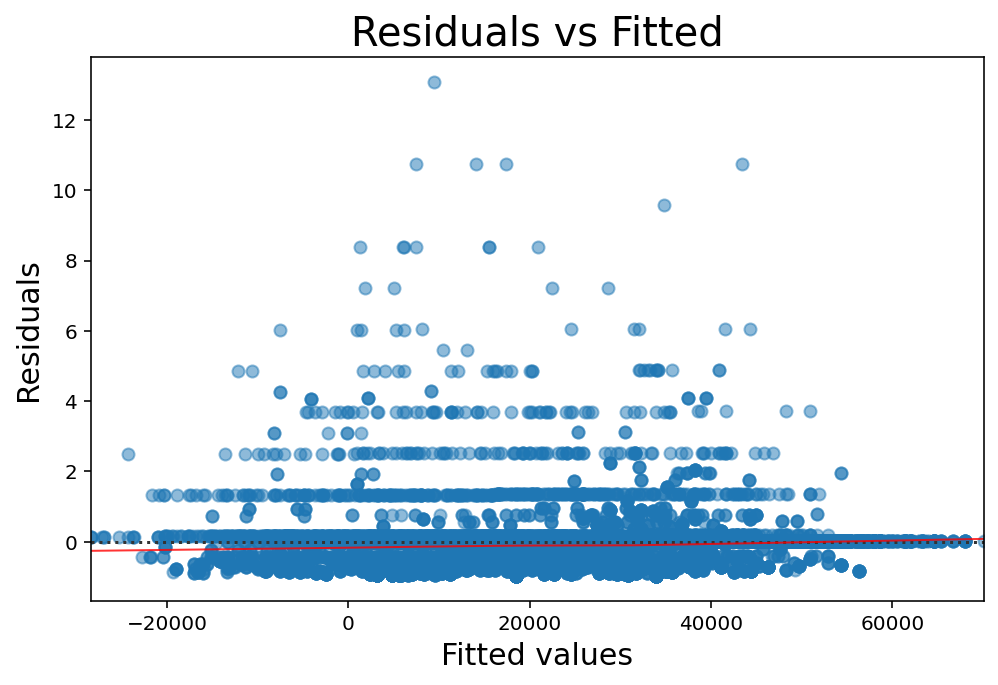

In [222]:
plot1 = plt.figure(figsize=(8, 5))
plot1.axes[0] = sns.residplot(model_fitted_y, listing_dame.columns[-1], data=listing_dame,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot1.axes[0].set_title('Residuals vs Fitted', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Residuals', fontdict={'fontsize':15});

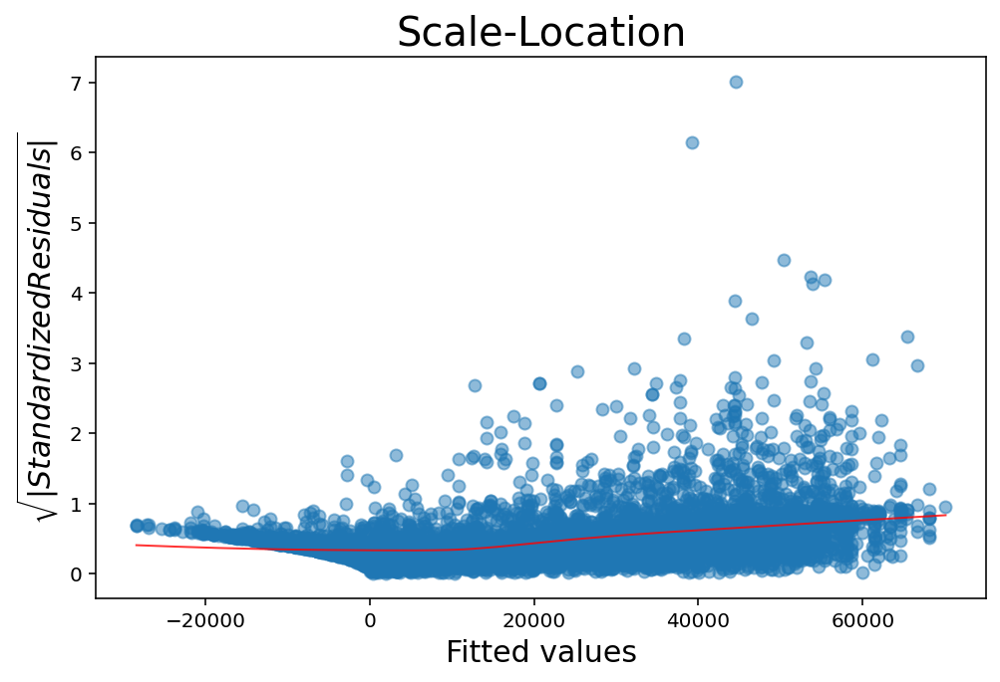

In [223]:
plot1 = plt.figure(figsize=(8, 5))

plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5);
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});
plot1.axes[0].set_title('Scale-Location',fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$', fontdict={'fontsize':15});

### 4-2-3 Normal Distribution of Residuals

Violate the normal distribution as the QQ-plot is completely biased.

<Figure size 576x360 with 0 Axes>

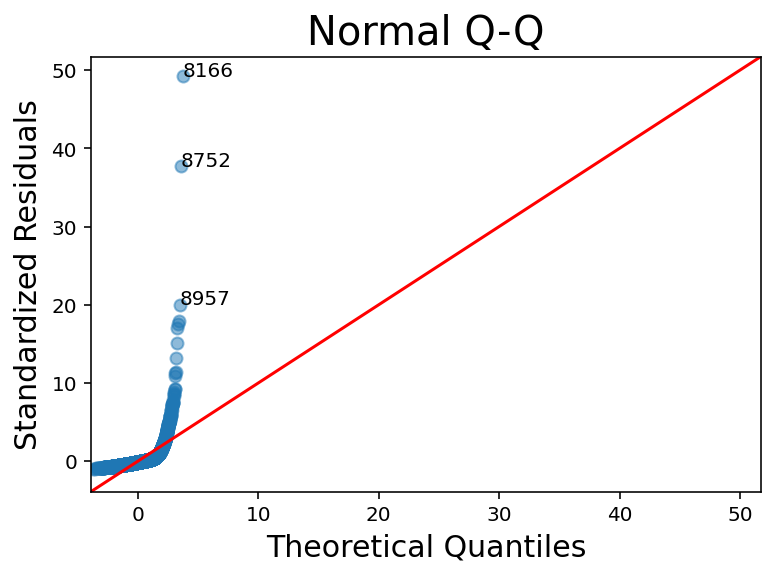

In [224]:
plot1 = plt.figure(figsize=(8, 5))

QQ = ProbPlot(model_norm_residuals)
plot1 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)

# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot1.axes[0].annotate(i,xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));
plot1.axes[0].set_title('Normal Q-Q', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Theoretical Quantiles', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Standardized Residuals', fontdict={'fontsize':15});
plot1.show()

### 4-2-4 Outlier Detection

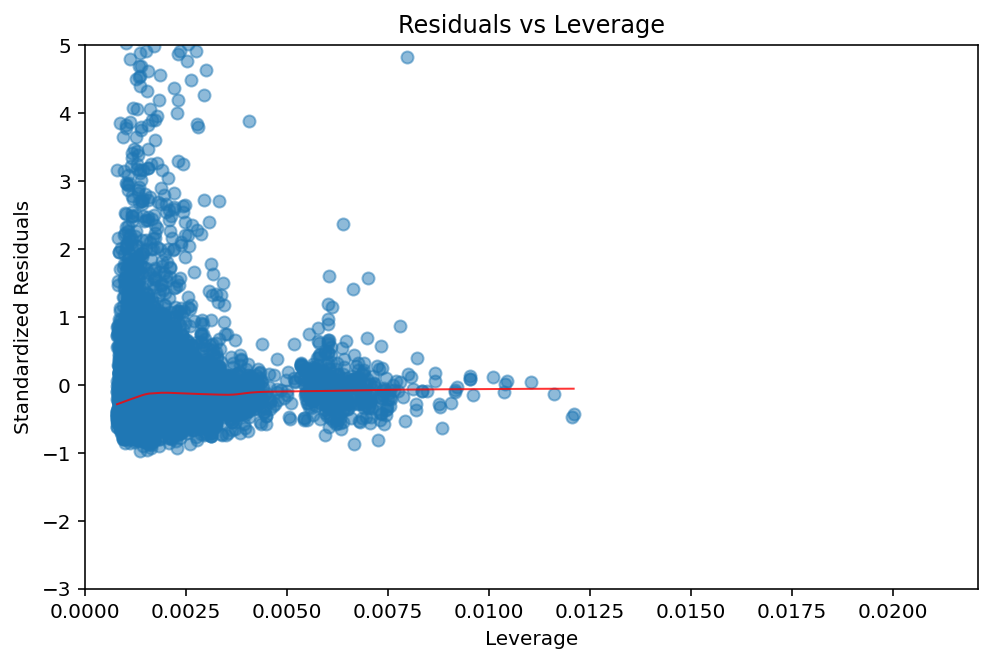

In [225]:
plot1 = plt.figure(figsize=(8, 5))
plt.scatter(model_leverage, model_norm_residuals, alpha=0.5);
sns.regplot(model_leverage, model_norm_residuals,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});

plot1.axes[0].set_title('Residuals vs Leverage')
plot1.axes[0].set_xlabel('Leverage')
plot1.axes[0].set_ylabel('Standardized Residuals');

# annotations
leverage_top_3 = np.flip(np.argsort(model_cooks), 0)[:3]
for i in leverage_top_3:
    plot1.axes[0].annotate(i,xy=(model_leverage[i],
                                    model_norm_residuals[i]));
plot1.axes[0].set_xlim(0, max(model_leverage)+0.01)
plot1.axes[0].set_ylim(-3, 5)
plot1.show()

## 4-3 Linear Regression Model 2 - Using Transformed Response Variable (log)

As the normal distribution of residuals is not met, we need to transform the response variable in order to keep this most important assumption.

In [226]:
listing_dame2 = listing_dame.copy()

In [227]:
listing_dame2['log_revenue'] = np.log2(listing_dame2['annual_listing_revenue'])

In [228]:
# Run regression
model2 = smf.ols(
    "log_revenue ~ host_is_superhost + \
                    C(host_response_time) + C(host_acceptance_rate) + C(host_total_listings_count) + host_identity_verified + \
                    C(room_type) + C(accommodates) + C(bedrooms) + C(beds) + C(availability_365) + \
                    C(number_of_reviews_l30d) + C(review_scores_value) + instant_bookable + C(calculated_host_listings_count) + \
                    C(reviews_per_month) + essentials + C(other_amenities) + C(bathrooms_number) + C(number_host_verifications) + C(host_experience)",
    listing_dame2,
    weights=listing_dame2["weights"],
).fit()

print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:            log_revenue   R-squared:                       0.366
Model:                            OLS   Adj. R-squared:                  0.365
Method:                 Least Squares   F-statistic:                     302.6
Date:                Sat, 20 Aug 2022   Prob (F-statistic):               0.00
Time:                        12:34:10   Log-Likelihood:                -21860.
No. Observations:               11023   AIC:                         4.376e+04
Df Residuals:                   11001   BIC:                         4.392e+04
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

## 4-4 Checking Assumptions of Linear Regression Model 2

### 4-4-1 Linearity

Neglect this part as all variables have been categorized into few levels. 

### 4-4-2 Independence of Observations and Constant Variance

- Constance Variance is kept as the residual is roughly equally spead out around the zero.
- Independence of Observation is also met as the points look randomized in the second plot with randomized residuals. 

In [229]:
model_fitted_y = model2.fittedvalues
model_residuals = model2.resid
model_norm_residuals = model2.get_influence().resid_studentized_internal
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
model_abs_resid = np.abs(model_residuals)
model_leverage = model2.get_influence().hat_matrix_diag
model_cooks = model2.get_influence().cooks_distance[0]

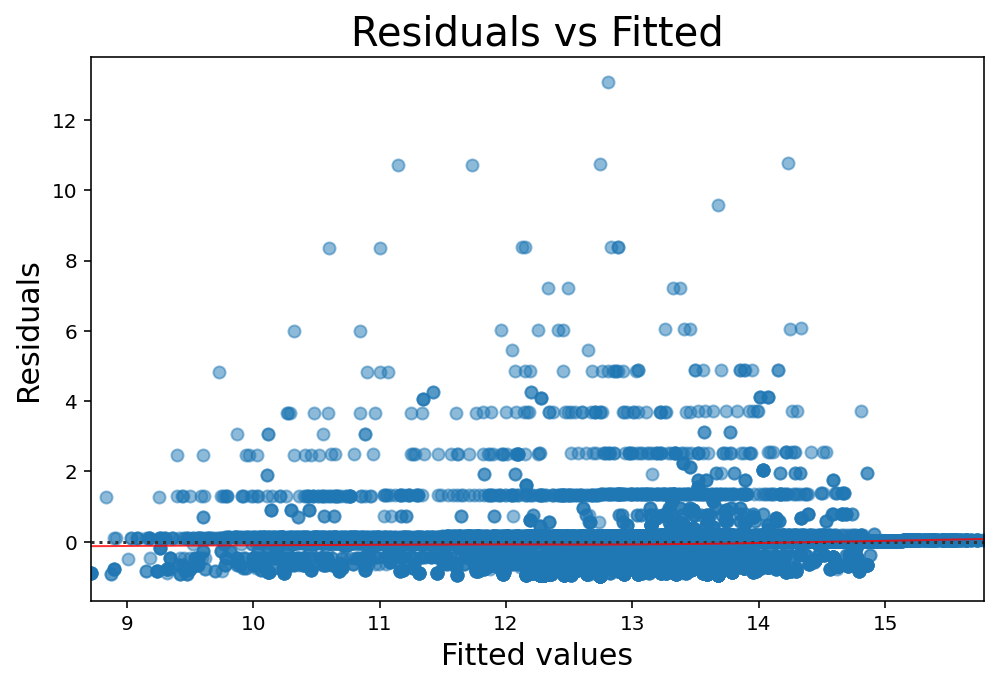

In [230]:
plot1 = plt.figure(figsize=(8, 5))
plot1.axes[0] = sns.residplot(model_fitted_y, listing_dame.columns[-1], data=listing_dame,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot1.axes[0].set_title('Residuals vs Fitted', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Residuals', fontdict={'fontsize':15});

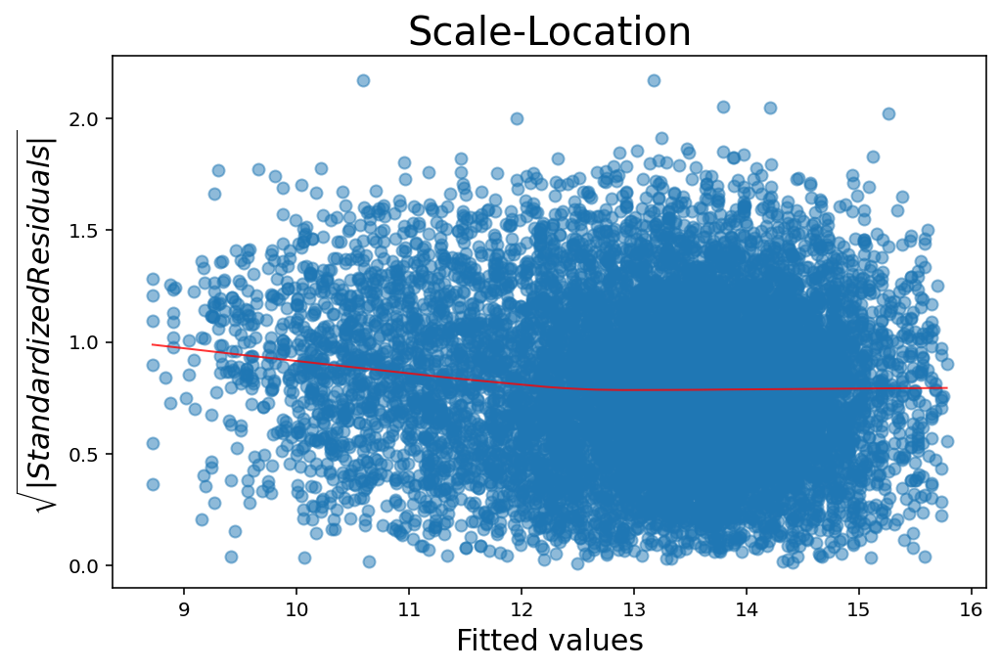

In [231]:
plot1 = plt.figure(figsize=(8, 5))

plt.scatter(model_fitted_y, model_norm_residuals_abs_sqrt, alpha=0.5);
sns.regplot(model_fitted_y, model_norm_residuals_abs_sqrt,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});
plot1.axes[0].set_title('Scale-Location',fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Fitted values', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('$\sqrt{|Standardized Residuals|}$', fontdict={'fontsize':15});

### 4-4-3 Normal Distribution of Residuals

The normal distribution assumption is well met as the QQ-plot is completely aligned with the slope.

<Figure size 576x360 with 0 Axes>

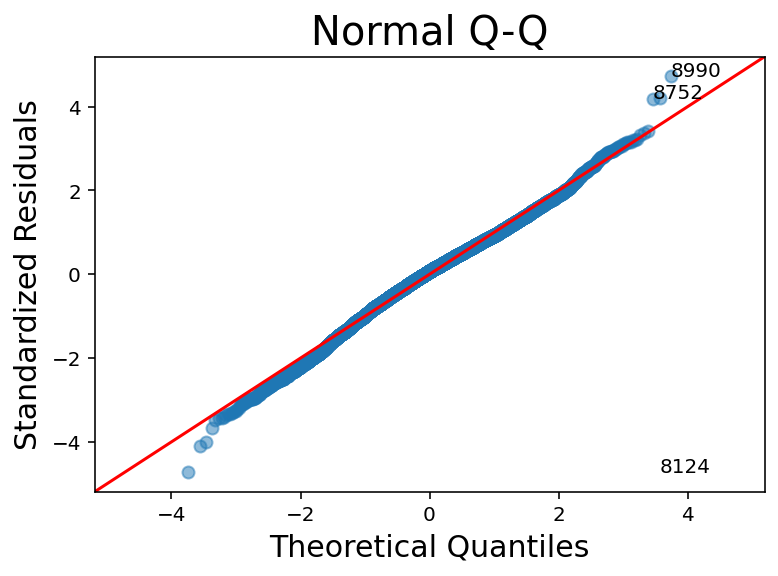

In [232]:
plot1 = plt.figure(figsize=(8, 5))

QQ = ProbPlot(model_norm_residuals)
plot1 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)

# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot1.axes[0].annotate(i,xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));
plot1.axes[0].set_title('Normal Q-Q', fontdict={'fontsize':20})
plot1.axes[0].set_xlabel('Theoretical Quantiles', fontdict={'fontsize':15})
plot1.axes[0].set_ylabel('Standardized Residuals', fontdict={'fontsize':15});
plot1.show()

### 4-4-4 Outlier Detection

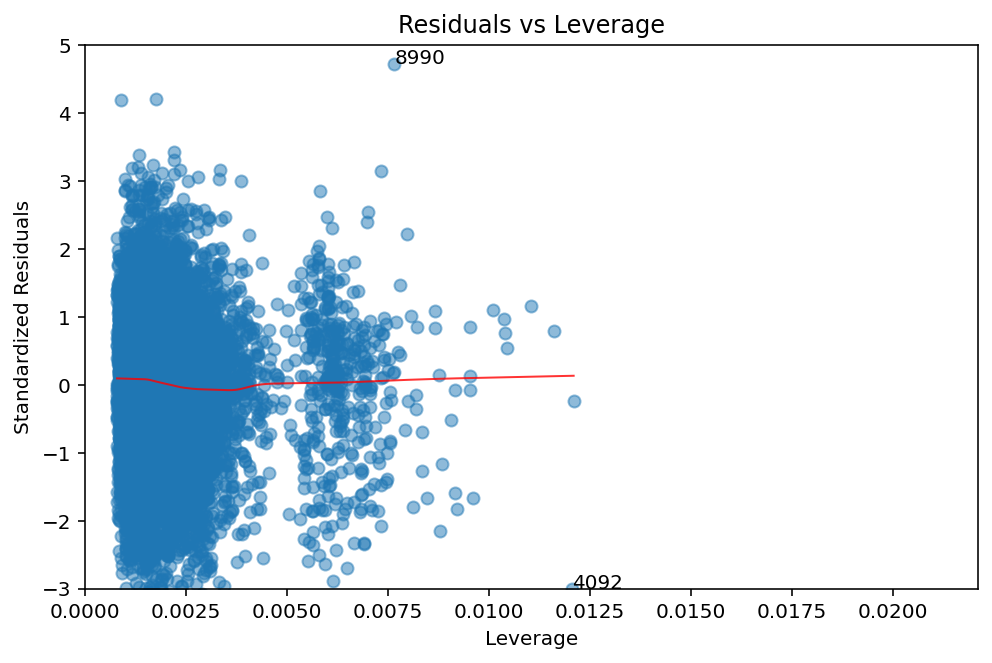

In [233]:
plot1 = plt.figure(figsize=(8, 5))
plt.scatter(model_leverage, model_norm_residuals, alpha=0.5);
sns.regplot(model_leverage, model_norm_residuals,
            scatter=False,
            ci=False,
            lowess=True,
            line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8});

plot1.axes[0].set_title('Residuals vs Leverage')
plot1.axes[0].set_xlabel('Leverage')
plot1.axes[0].set_ylabel('Standardized Residuals');

# annotations
leverage_top_3 = np.flip(np.argsort(model_cooks), 0)[:3]
for i in leverage_top_3:
    plot1.axes[0].annotate(i,xy=(model_leverage[i],
                                    model_norm_residuals[i]));
plot1.axes[0].set_xlim(0, max(model_leverage)+0.01)
plot1.axes[0].set_ylim(-3, 5)
plot1.show()

## 4-5 Final Model - Clustering by Superhost

In [234]:
# Drop any entries with missing data from the model
fe_groups = listing_dame2.copy()
for i in listing_dame2.columns:
    fe_groups = fe_groups[pd.notnull(fe_groups[i])]

In [235]:
# Adjust SEs
# Again, suppressing actual output for space with semicolon
print(model2.get_robustcov_results(cov_type='cluster',
                            groups=fe_groups.host_is_superhost).summary())

                            OLS Regression Results                            
Dep. Variable:            log_revenue   R-squared:                       0.366
Model:                            OLS   Adj. R-squared:                  0.365
Method:                 Least Squares   F-statistic:                    0.1182
Date:                Sat, 20 Aug 2022   Prob (F-statistic):              0.789
Time:                        13:24:12   Log-Likelihood:                -21860.
No. Observations:               11023   AIC:                         4.376e+04
Df Residuals:                   11001   BIC:                         4.392e+04
Df Model:                          21                                         
Covariance Type:              cluster                                         
                                             coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------

# 5. Results

## 5-1 Causal Effect with Confidence Interval and Error Range

In [236]:
m = model2.get_robustcov_results(cov_type='cluster',
                            groups=fe_groups.host_is_superhost)
clus_conf = []
for i in m.conf_int():
  clus_conf.append(i[0])

err_series = m.params - model2.conf_int()[0]


In [237]:
# Calcualte the error bar lengths for confidence intervals.
coef_df = pd.DataFrame({'varname': err_series.index.values[1:],
                        'coef': m.params[1:],
                        'err': err_series[1:],
                       })

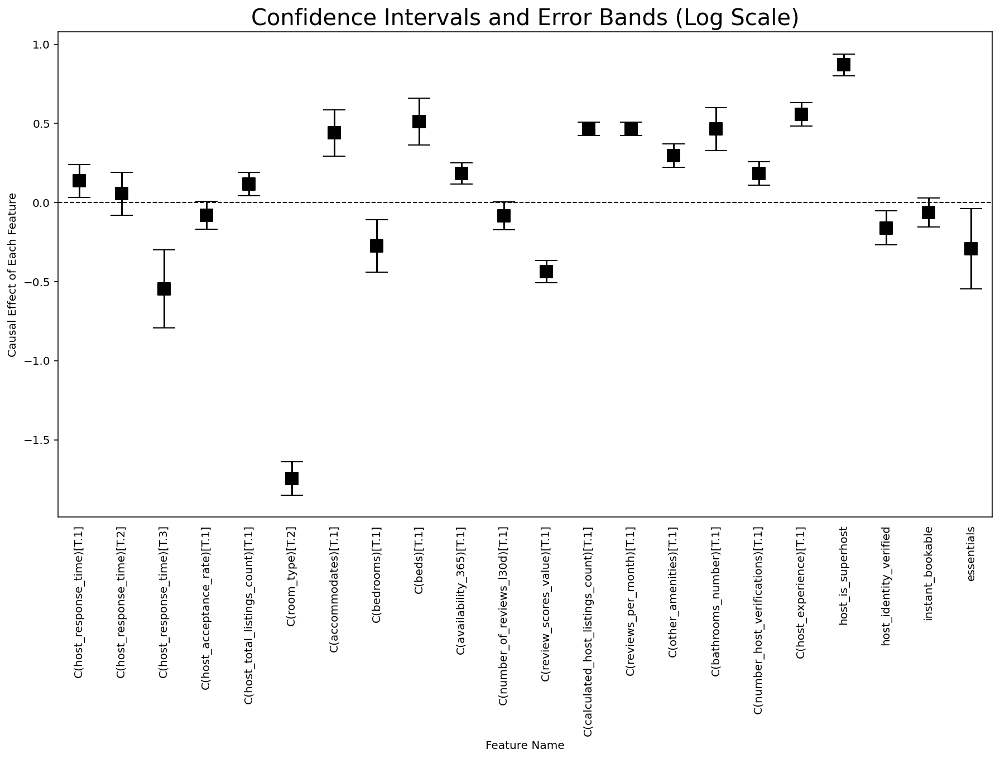

In [238]:
fig, ax = plt.subplots(figsize=(15, 8))
coef_df.plot(x='varname', y='coef', kind='bar', 
             ax=ax, color='none', capsize=10,
             yerr='err', legend=False)

ax.set_title('Confidence Intervals and Error Bands (Log Scale)', fontdict={'fontsize':20})
ax.set_ylabel('Causal Effect of Each Feature')
ax.set_xlabel('Feature Name')
ax.scatter(x=pd.np.arange(coef_df.shape[0]), 
           marker='s', s=120, 
           y=coef_df['coef'], color='black')
ax.axhline(y=0, linestyle='--', color='black', linewidth=1)
ax.xaxis.set_ticks_position('none')
_ = ax.set_xticklabels(coef_df.varname, 
                       rotation=90)

## 5-2 Average Treatment Effect

In [239]:
test = listing_dame2.copy()
test.host_is_superhost = listing_dame2.host_is_superhost.astype('category')

In [240]:
source = test
axis_labels = ("datum.label == 0 ? 'Regular Hosts': 'Super Hosts'")

alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('log_revenue',title='Log Annual Listing Revenue ($)', scale=alt.Scale()),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2')),
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts (Log Scale)"

).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)

In [241]:
alt.Chart(source).mark_boxplot(clip=True, size=50, extent="min-max").encode(
    x=alt.X("host_is_superhost:O", title=None, axis=alt.Axis(labels=True, labelExpr=axis_labels, labelAngle=360)), 
    y=alt.Y('annual_listing_revenue:Q',title='Annual Listing Revenue ($)', scale=alt.Scale(domain=(0, 40000))),
    color=alt.Color('host_is_superhost', legend=None, scale=alt.Scale(scheme='dark2'))
).properties(
    width=300,
    height=300,
    title="Revenue generation for Regular and Super Hosts (Zoomed In View)"
).configure_axis(
    labelFontSize=12,
    titleFontSize=12
)


alt.Chart(...)